In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scvelo as scv
from scipy import io
import scvelo as scv

sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

# set random seed for reproducibility:
np.random.seed(42)


The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


In [2]:
# set working dir 
os.chdir('/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Velmeshev_2019/')

fig_dir = 'figures/'
data_dir = 'data/'


In [3]:
# re-load processed data:
adata = sc.read_h5ad('{}/Velmeshev_2019_processed.h5ad'.format(data_dir))

In [4]:
# save the object with counts matrix as X
adata.X = adata.layers['counts']
adata.write('{}/Velmeshev_2019_processed_counts.h5ad'.format(data_dir))

## Load Velmeshev dataset

In [3]:
count_data_dir = '/dfs3b/swaruplab/shared_lab/cross-disorder/count_matrices/ASD_Velmeshev_2019/'
samples = [s for s in os.listdir(count_data_dir)]
adata_list = []
for sample in samples:
    try:
        adata = sc.read_h5ad('{}{}/scanpy_preprocessing_cellbender/data/adata_unfiltered.h5ad'.format(count_data_dir, sample))
    except:
        print('sample', sample, ' error')
        continue
    adata.obs['Sample'] = sample
    adata.obs['Study'] = 'Swarup_2021'
    adata.obs['orig_barcode'] = adata.obs.index

    adata_list.append(adata)

    print(sample, adata.layers['spliced'].shape)


SRR9262917 (3388, 36601)
SRR9262918 (7265, 36601)
SRR9262919 (3763, 36601)
SRR9262920 (2085, 36601)
SRR9262921 (4116, 36601)
SRR9262922 (2872, 36601)
SRR9262923 (4220, 36601)
SRR9262924 (3568, 36601)
SRR9262925 (3338, 36601)
SRR9262926 (3887, 36601)
SRR9262927 (2474, 36601)
SRR9262928 (2724, 36601)
SRR9262929 (4882, 36601)
SRR9262930 (1882, 36601)
SRR9262931 (5151, 36601)
SRR9262932 (4943, 36601)
SRR9262933 (5498, 36601)
SRR9262934 (2911, 36601)
SRR9262935 (2685, 36601)
SRR9262936 (4077, 36601)
SRR9262937 (3538, 36601)
SRR9262938 (2544, 36601)
SRR9262939 (2065, 36601)
SRR9262940 (3520, 36601)
SRR9262941 (3648, 36601)
SRR9262942 (2739, 36601)
SRR9262943 (5623, 36601)
SRR9262944 (3048, 36601)
SRR9262945 (3304, 36601)
SRR9262946 (7806, 36601)
SRR9262947 (4222, 36601)
SRR9262948 (1617, 36601)
SRR9262949 (2785, 36601)
SRR9262950 (3439, 36601)
SRR9262951 (2765, 36601)
SRR9262952 (3280, 36601)
SRR9262953 (2419, 36601)
SRR9262954 (2507, 36601)
SRR9262955 (7072, 36601)
SRR9262956 (4843, 36601)


In [43]:
# concatenate
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index

# filter small cells
sc.pp.filter_cells(adata, min_counts = 250)

# add counts layer
adata.layers["counts"] = adata.X.copy()

# print shape of dataset
adata.shape


(170416, 36601)

In [44]:
# load sample meta:
sample_meta = pd.read_csv(
    'data/ASD_SRR.csv',
    sep=','
)

temp = adata.obs.merge(
    sample_meta,
    how='left',
    left_on = 'Sample',
    right_on = 'Run'
)

temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None

In [47]:
adata.obs['Library Name'].value_counts()

5387_BA9          7685
5841_BA9          7169
5554_BA24         6683
4849_BA24         5433
5939_BA9          5383
4341_BA24         5029
4341_BA46         4890
5577_BA9          4836
5242_BA24_Nova    4487
5893_PFC_Nova     4129
5565_BA24         4073
5531_BA9          4035
4899_BA24_Nova    3869
5391_BA24_Nova    3859
5546_BA9_Nova     3846
5893_BA24         3727
5958_BA24         3587
5538_PFC_Nova     3471
5278_BA24_Nova    3464
5945_PFC_Nova     3356
5278_PFC_Nova     3313
5294_BA9          3295
5893_BA9          3280
5864_BA9          3270
5419_PFC          3132
5978_BA24         3100
5294_BA24         2985
5565_BA9          2776
5408_PFC_Nova     2737
5939_BA24         2670
6033_BA24         2649
5981_BA9_Nova     2647
6032_BA24_Nova    2646
5936_PFC_Nova     2614
5531_BA24         2605
5163_BA24         2534
5958_BA9          2525
6033_BA9          2442
5144_PFC_Nova     2418
5787_BA9_Nova     2335
5879_PFC_Nova     2066
5609_BA9_Nova     2054
5978_BA9          2025
5976_BA9   

In [55]:
sample_meta = pd.read_csv(
    'data/Velmeshev_sample_meta.csv',
    sep=','
)
sample_meta.shape

(56, 11)

In [96]:
# load other sample data:

sample_meta = pd.read_csv(
    'data/Velmeshev_sample_meta.csv',
    sep=','
)
sample_meta

cols_to_use = sample_meta.columns.difference(adata.obs.columns)


temp = adata.obs.merge(
    sample_meta[cols_to_use],
    how='left',
    left_on = 'Library Name',
    right_on = 'Sample name'
)

temp.head()
temp.shape

temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None

In [97]:
# save unfiltered dataset:
adata.write_h5ad('{}Velmeshev_2019_unfiltered.h5ad'.format(data_dir))


... storing 'orig_barcode' as categorical
... storing 'Sample' as categorical
... storing 'Study' as categorical
... storing 'Run' as categorical
... storing 'BioProject' as categorical
... storing 'BioSample' as categorical
... storing 'disease' as categorical
... storing 'Experiment' as categorical
... storing 'Instrument' as categorical
... storing 'Library Name' as categorical
... storing 'Sample Name' as categorical
... storing 'sex' as categorical
... storing 'SRA Study' as categorical
... storing 'region' as categorical
... storing 'Capbatch' as categorical
... storing 'Diagnosis' as categorical
... storing 'Region' as categorical
... storing 'Sample name' as categorical
... storing 'Seqbatch' as categorical
... storing 'Sex' as categorical
... storing 'epilepsy' as categorical


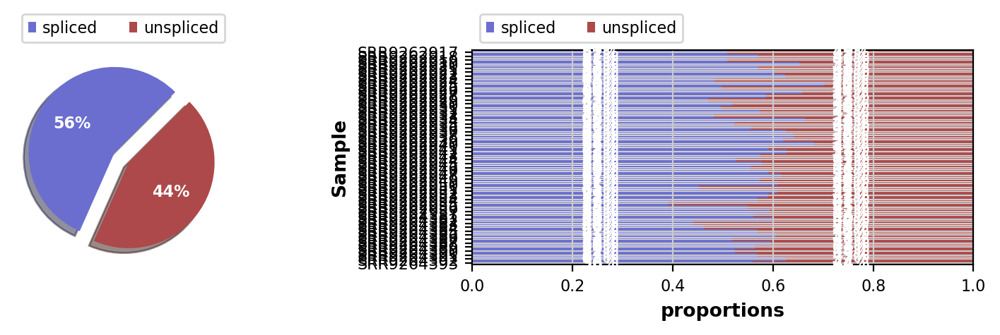

In [98]:
scv.pl.proportions(adata, groupby='Sample')

## QC Filtering

In [99]:
# load unfiltered data 
adata = sc.read_h5ad('{}Velmeshev_2019_unfiltered.h5ad'.format(data_dir))
type(adata)

anndata._core.anndata.AnnData

In [100]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=True, inplace=True)

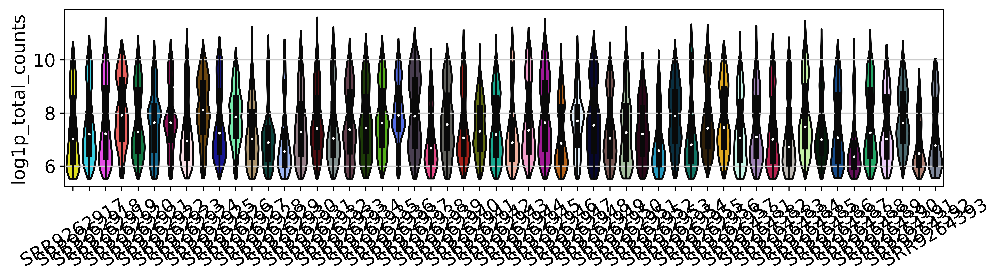

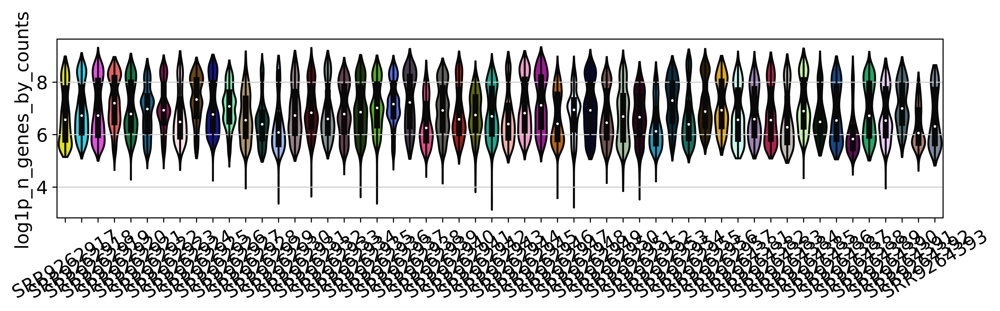

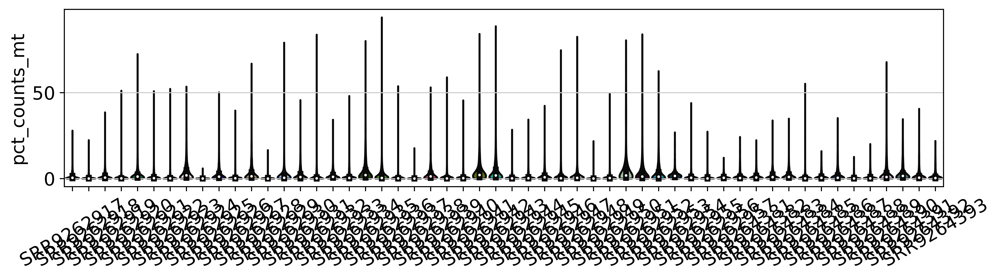

In [101]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'log1p_n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [102]:

mt_quantile = 0.95 
umi_quantile = 0.95
doublet_quantile = 0.95

samples = adata.obs.Sample.value_counts().index.to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Sample == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_scores.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_scores < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    

SRR9262946 removed  1151 , kept  6534
SRR9262918 removed  1054 , kept  6115
SRR9262955 removed  1004 , kept  5679
SRR9262933 removed  826 , kept  4607
SRR9262943 removed  811 , kept  4572
SRR9262931 removed  756 , kept  4273
SRR9262932 removed  732 , kept  4158
SRR9262956 removed  692 , kept  4144
SRR9262929 removed  678 , kept  3809
SRR9262923 removed  613 , kept  3516
SRR9262921 removed  616 , kept  3457
SRR9262936 removed  596 , kept  3439
SRR9262926 removed  600 , kept  3269
SRR9262947 removed  575 , kept  3284
SRR9264383 removed  566 , kept  3280
SRR9262919 removed  560 , kept  3167
SRR9262941 removed  552 , kept  3035
SRR9262937 removed  526 , kept  2945
SRR9262924 removed  522 , kept  2942
SRR9262940 removed  511 , kept  2845
SRR9262925 removed  497 , kept  2816
SRR9262945 removed  470 , kept  2825
SRR9264385 removed  474 , kept  2806
SRR9262917 removed  472 , kept  2798
SRR9262950 removed  470 , kept  2662
SRR9262952 removed  481 , kept  2619
SRR9262944 removed  443 , kept  254

In [103]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)].copy()
adata

AnnData object with n_obs × n_vars = 144816 × 36601
    obs: 'orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study', 'batch', 'barcode', 'Run', 'AGE', 'AvgSpotLen', 'BioProject', 'BioSample', 'disease', 'Experiment', 'Instrument', 'isolate', 'Library Name', 'Sample Name', 'sex', 'SRA Study', 'region', 'Age', 'Capbatch', 'Diagnosis', 'Individual', 'PMI', 'RIN', 'Region', 'Sample name', 'Seqbatch', 'Sex', 'epilepsy', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'Sample_colors'
    layers: 'counts', 'spliced', 'unspliced'

In [104]:
adata = adata[adata.obs.n_genes_by_counts >= 250].copy()
adata = adata[adata.obs.pct_counts_mt <= 10].copy()

adata.shape

(133333, 36601)

## Process data

In [105]:
# preserve the counts in its own layer
adata.layers['counts'] = adata.X

In [106]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [107]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)


In [108]:
sc.tl.pca(adata, svd_solver='arpack')

In [109]:
sc.external.pp.harmony_integrate(adata, key = 'Sample')

2022-03-16 12:12:56,645 - harmonypy - INFO - Iteration 1 of 10
2022-03-16 12:14:02,387 - harmonypy - INFO - Iteration 2 of 10
2022-03-16 12:15:08,983 - harmonypy - INFO - Iteration 3 of 10
2022-03-16 12:16:15,179 - harmonypy - INFO - Iteration 4 of 10
2022-03-16 12:17:09,611 - harmonypy - INFO - Iteration 5 of 10
2022-03-16 12:17:46,219 - harmonypy - INFO - Converged after 5 iterations


In [110]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

In [111]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [112]:
sc.tl.leiden(adata, resolution=1)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

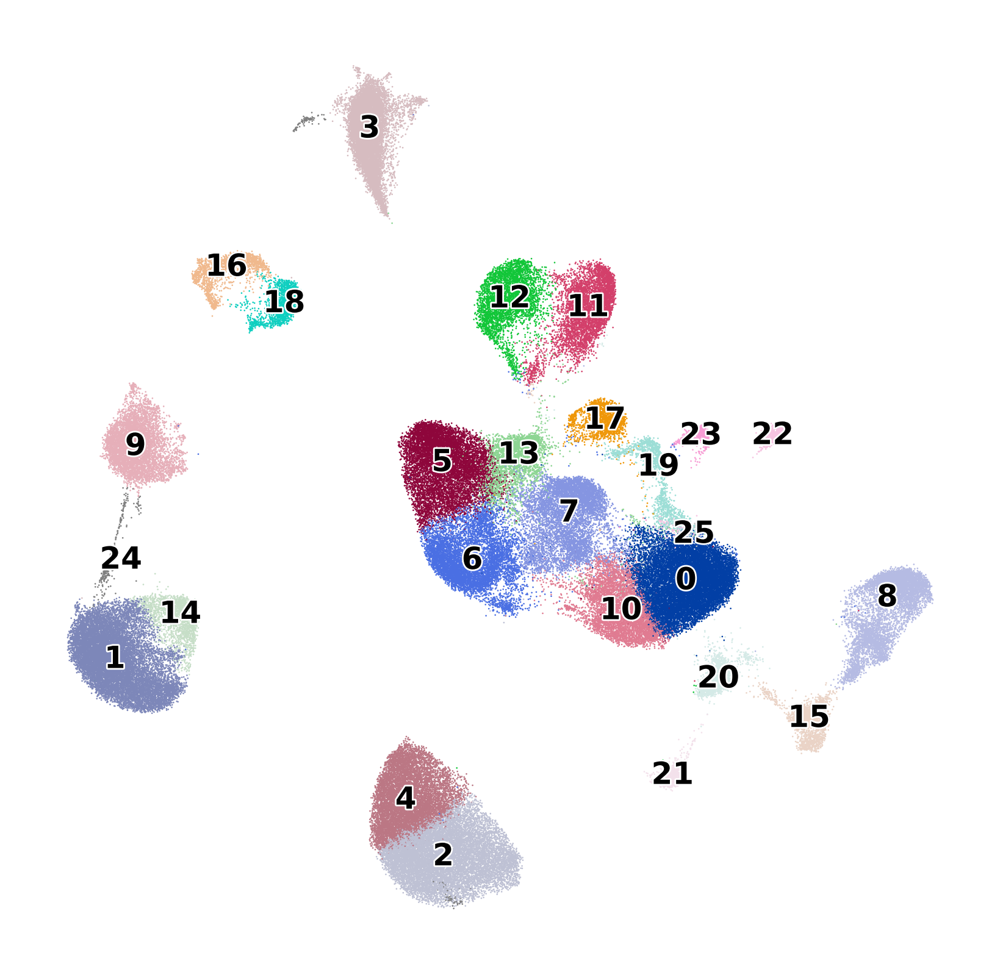

In [113]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden.pdf'
)


categories: 0, 1, 2, etc.
var_group_labels: Oligodendrocyte, Astrocyte, Microglia, etc.


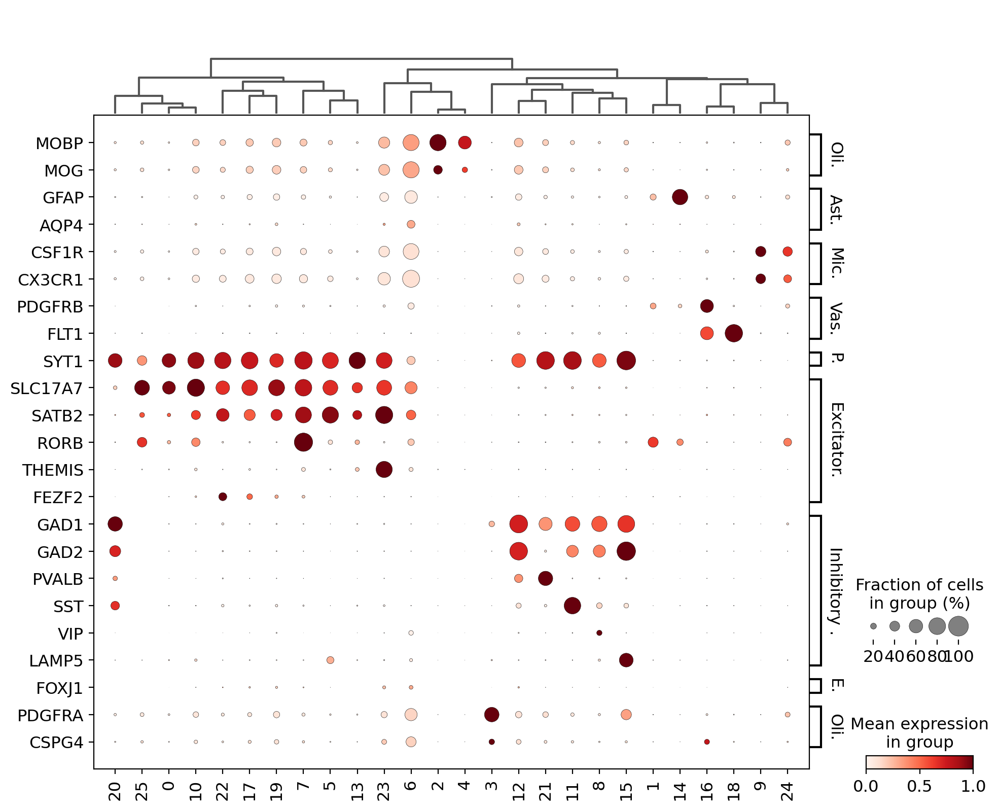

In [114]:
marker_dict = {
    'Oligodendrocyte': ['MOBP', 'MOG'],
    'Astrocyte': ['GFAP', 'AQP4'],
    'Microglia': ['CSF1R', 'CX3CR1',],
    'Vasculature': ['PDGFRB', 'FLT1'],
    'Pan-neuronal': ['SYT1'],
    'Excitatory Neuron': ['SLC17A7', 'SATB2', 'RORB', 'THEMIS', 'FEZF2'],
    'Inhibitory Neuron': ['GAD1', 'GAD2', 'PVALB', 'SST', 'VIP', 'LAMP5'],
    'Ependyma' : ['FOXJ1'], # not expressed
    'Oligodendrocyte Progenitor': ['PDGFRA', 'CSPG4']
}

sc.set_figure_params(dpi=100)
sc.pl.dotplot(
    adata, marker_dict, 'leiden', 
    dendrogram=True, 
    standard_scale='var', swap_axes=True
)


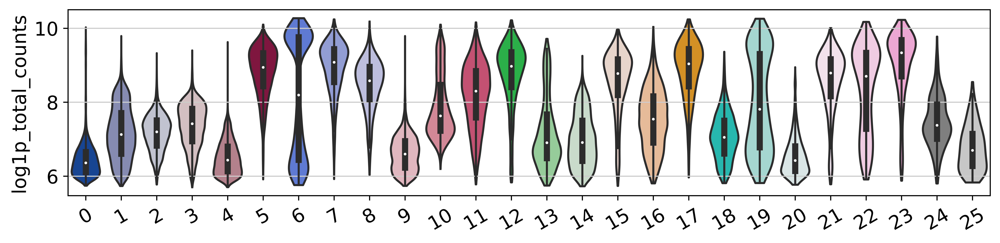

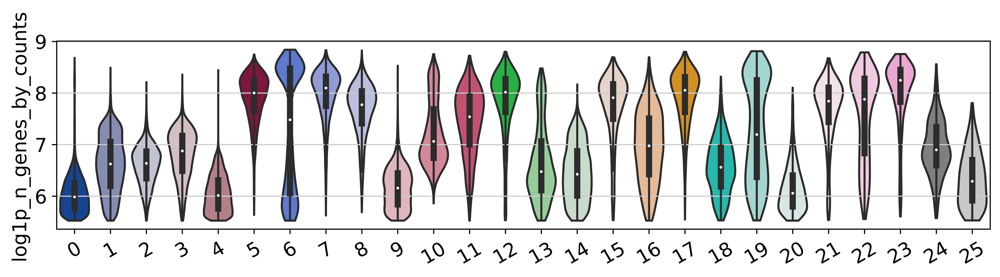

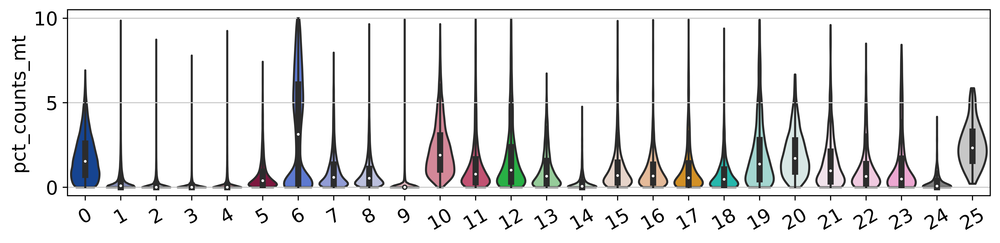

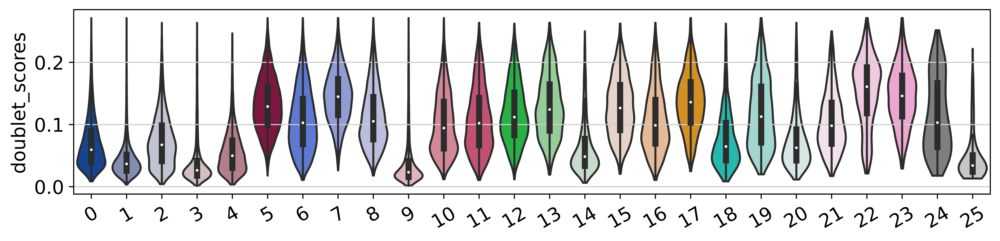

In [115]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'log1p_n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'doublet_scores'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)

## Annotate clusters

In [116]:

# load cluster anno df 
anno_df = pd.read_csv('data/Velmeshev_leiden_clusters.csv')

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')

adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()
adata.obs['annotation'] = temp['annotation'].astype(str).to_list()



In [117]:
# remove unknown & doublet clusters:
clusters_to_remove = ['Unknown', 'Doublet']
adata = adata[~adata.obs.annotation.isin(clusters_to_remove)].copy()


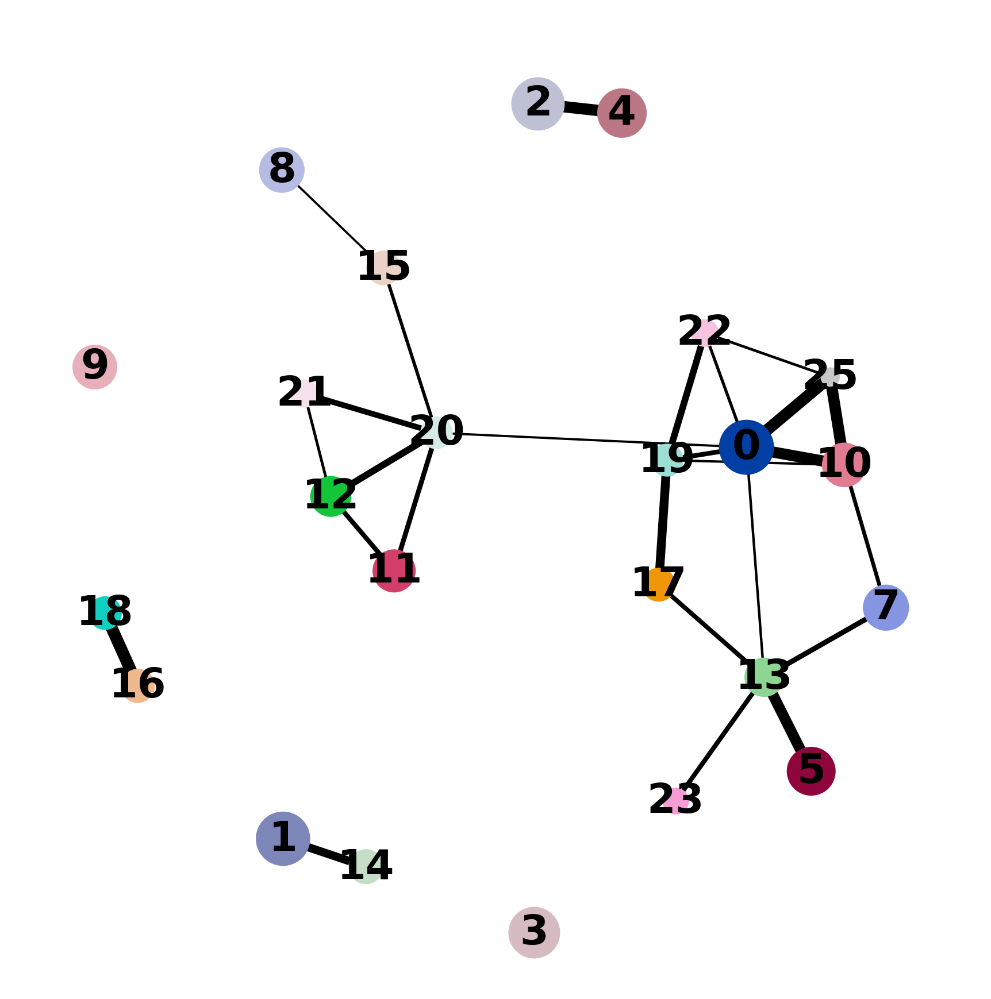

In [119]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.15, title='', edge_width_scale=0.5,
    frameon=False, save=True
)


In [120]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.35, init_pos='paga')

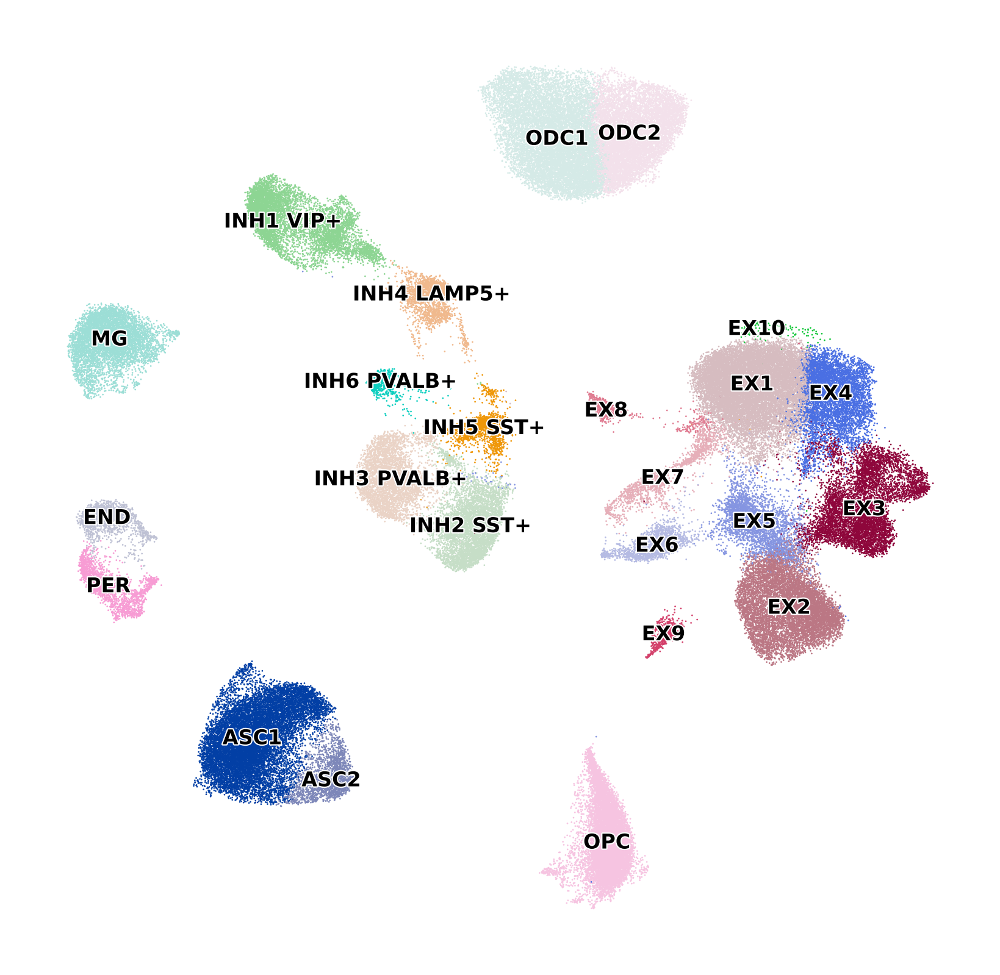

In [121]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=.75, 
    legend_fontsize=6, 
    title='',
    save='_annotation_paga.pdf'
)


## Save processed data

In [127]:
# write anndata:
adata.write_h5ad('{}/Velmeshev_2019_processed.h5ad'.format(data_dir))

In [124]:
# write obs table 
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]
adata.obs.to_csv('{}/Velmeshev_2019_processed_obs.csv'.format(data_dir))

# write var table:
adata.var.to_csv('{}/Velmeshev_2019_processed_var.csv'.format(data_dir))

In [125]:
# save the sparse matrix for Seurat:
X = adata.layers['counts']
X = scipy.sparse.csr_matrix.transpose(X)
io.mmwrite('{}/Velmeshev_2019_counts.mtx'.format(data_dir), X)

In [126]:
# save the Harmony Matrix for Seurat:
pd.DataFrame(adata.obsm['X_pca_harmony']).to_csv('{}Velmeshev_2019_processed_harmony.csv'.format(data_dir))


## test topometry

In [5]:
import topo as tp
import celltometry as ct

ModuleNotFoundError: No module named 'torch'